In [1]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [6]:
import pandas as pd
df = pd.read_csv("diabetes_prediction_dataset.csv")




In [3]:
df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,Female,80.0,0,0,No Info,27.32,6.2,90,0
99996,Female,2.0,0,0,No Info,17.37,6.5,100,0
99997,Male,66.0,0,0,former,27.83,5.7,155,0
99998,Female,24.0,0,0,never,35.42,4.0,100,0


In [12]:
pip install seaborn


  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached matplotlib-3.9.2-cp312-cp312-win_amd64.whl.metadata (11 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached fonttools-4.53.1-cp312-cp312-win_amd64.whl.metadata (165 kB)
  Using cached kiwisolver-1.4.5-cp312-cp312-win_amd64.whl.metadata (6.5 kB)
  Using cached pillow-10.4.0-cp312-cp312-win_amd64.whl.metadata (9.3 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
Using cached matplotlib-3.9.2-cp312-cp312-win_amd64.whl (7.8 MB)
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
Using cached fonttools-4.53.1-cp312-cp312-win_amd64.whl (2.2 MB)
Using cached kiwisolver-1.4.5-cp312-cp312-win_amd64.whl (56 kB)
Using cached pillow-10.4.0-cp312-cp312-win_amd64.whl (2.6 MB)
Note: you may need to restart the kernel to use updated packages.


In [15]:
pip install plotly # type: ignore

Note: you may need to restart the kernel to use updated packages.


ERROR: Invalid requirement: '#': Expected package name at the start of dependency specifier
    #
    ^


In [16]:

pip install scipy



  Using cached scipy-1.14.1-cp312-cp312-win_amd64.whl.metadata (60 kB)
Using cached scipy-1.14.1-cp312-cp312-win_amd64.whl (44.5 MB)


In [18]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from scipy import stats

checking data to find null value

In [17]:
df.shape

(100000, 9)

In [20]:
df.isnull().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64

In [21]:
df.info()
#by this dataset we can see some missing values in some columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   gender               100000 non-null  object 
 1   age                  100000 non-null  float64
 2   hypertension         100000 non-null  int64  
 3   heart_disease        100000 non-null  int64  
 4   smoking_history      100000 non-null  object 
 5   bmi                  100000 non-null  float64
 6   HbA1c_level          100000 non-null  float64
 7   blood_glucose_level  100000 non-null  int64  
 8   diabetes             100000 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 6.9+ MB


In [23]:
#checking duplicates
df.duplicated().sum() #it will check the entire row, if entire row is repeated then it will give true as output else false

#here in this df we dont have any duplicate values

np.int64(3854)

In [22]:
df.duplicated().unique()
#by this we can understand there is no duplicate values

array([False,  True])

In [24]:
#finding garbage values -- this is mostly in object dtype column like some unwanted alphanumeric values

for i in df.select_dtypes(include="object").columns:
    print(i)
    print(df[i].value_counts())

gender
gender
Female    58552
Male      41430
Other        18
Name: count, dtype: int64
smoking_history
smoking_history
No Info        35816
never          35095
former          9352
current         9286
not current     6447
ever            4004
Name: count, dtype: int64


In [25]:
#spelling check for object datatype columns befor encoding
for i in df.select_dtypes(include="object").columns:
    print(df[i].unique(),df[i].nunique())
    print("****"*10)


['Female' 'Male' 'Other'] 3
****************************************
['never' 'No Info' 'current' 'former' 'ever' 'not current'] 6
****************************************


EDA

In [26]:
!pip install scikit-learn

  Using cached scikit_learn-1.5.1-cp312-cp312-win_amd64.whl.metadata (12 kB)
  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached threadpoolctl-3.5.0-py3-none-any.whl.metadata (13 kB)
Using cached scikit_learn-1.5.1-cp312-cp312-win_amd64.whl (10.9 MB)
Using cached joblib-1.4.2-py3-none-any.whl (301 kB)
Using cached threadpoolctl-3.5.0-py3-none-any.whl (18 kB)


In [27]:
from sklearn.preprocessing import OrdinalEncoder

encoder = OrdinalEncoder()
df["gender"] = encoder.fit_transform(df[["gender"]])

In [28]:
df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0.0,80.0,0,1,never,25.19,6.6,140,0
1,0.0,54.0,0,0,No Info,27.32,6.6,80,0
2,1.0,28.0,0,0,never,27.32,5.7,158,0
3,0.0,36.0,0,0,current,23.45,5.0,155,0
4,1.0,76.0,1,1,current,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,0.0,80.0,0,0,No Info,27.32,6.2,90,0
99996,0.0,2.0,0,0,No Info,17.37,6.5,100,0
99997,1.0,66.0,0,0,former,27.83,5.7,155,0
99998,0.0,24.0,0,0,never,35.42,4.0,100,0


In [29]:
df["smoking_history"] = encoder.fit_transform(df[["smoking_history"]])

In [30]:
df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0.0,80.0,0,1,4.0,25.19,6.6,140,0
1,0.0,54.0,0,0,0.0,27.32,6.6,80,0
2,1.0,28.0,0,0,4.0,27.32,5.7,158,0
3,0.0,36.0,0,0,1.0,23.45,5.0,155,0
4,1.0,76.0,1,1,1.0,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,0.0,80.0,0,0,0.0,27.32,6.2,90,0
99996,0.0,2.0,0,0,0.0,17.37,6.5,100,0
99997,1.0,66.0,0,0,3.0,27.83,5.7,155,0
99998,0.0,24.0,0,0,4.0,35.42,4.0,100,0


In [31]:
#Descriptive statistics - it will show for only numerical columns

df.describe() 

#by this we can understand how the dataset is and how is spearding 

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
count,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,0.414660,41.885856,0.07485,0.039420,2.179650,27.320767,5.527507,138.058060,0.085000
std,0.493031,22.516840,0.26315,0.194593,1.889659,6.636783,1.070672,40.708136,0.278883
min,0.000000,0.080000,0.00000,0.000000,0.000000,10.010000,3.500000,80.000000,0.000000
25%,0.000000,24.000000,0.00000,0.000000,0.000000,23.630000,4.800000,100.000000,0.000000
50%,0.000000,43.000000,0.00000,0.000000,3.000000,27.320000,5.800000,140.000000,0.000000
75%,1.000000,60.000000,0.00000,0.000000,4.000000,29.580000,6.200000,159.000000,0.000000
max,2.000000,80.000000,1.00000,1.000000,5.000000,95.690000,9.000000,300.000000,1.000000


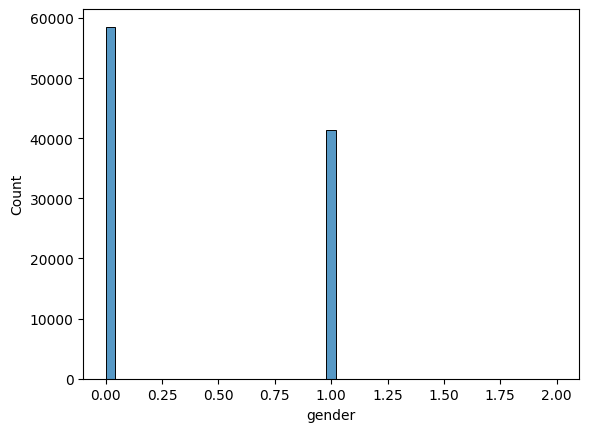

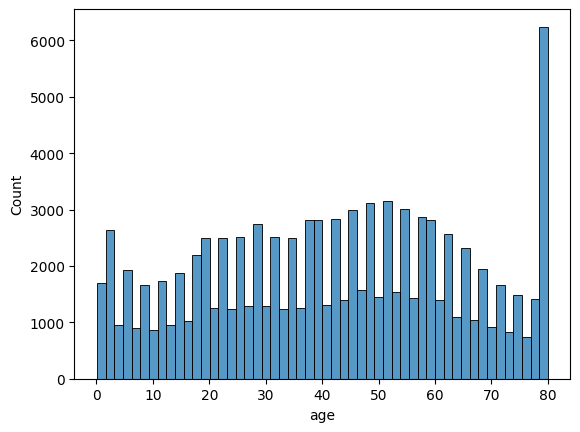

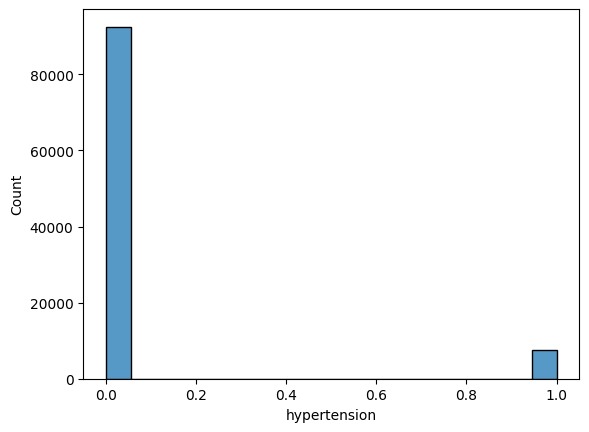

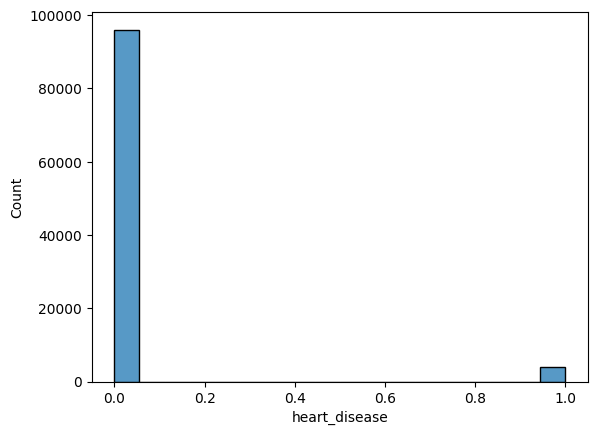

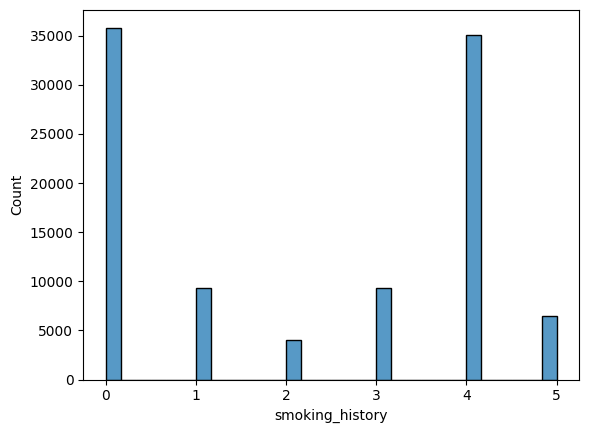

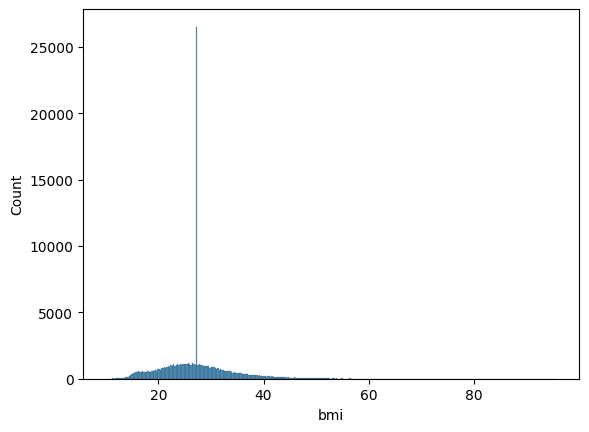

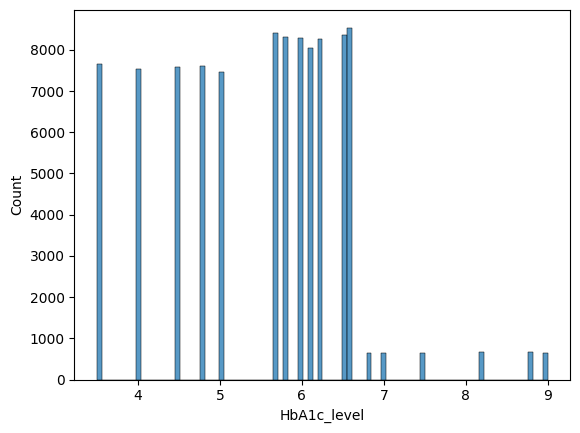

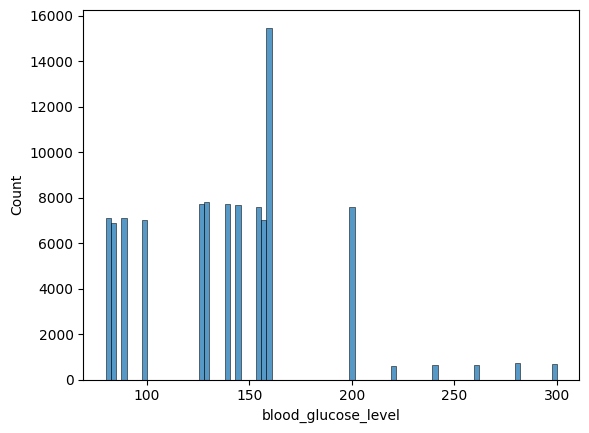

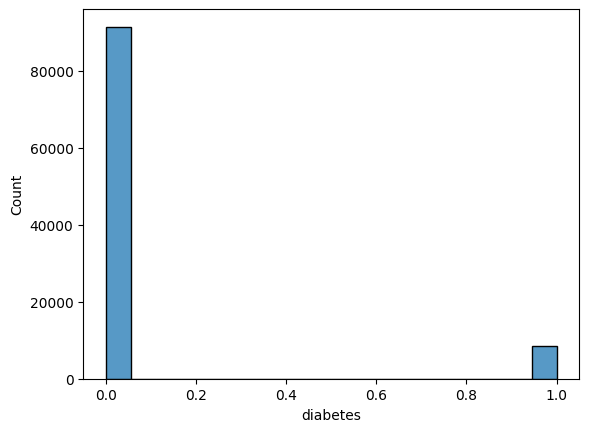

In [32]:
#histogram - to understand the distibution - frequency plot
#only for numerical columns

for i in df.columns:
    sns.histplot(data = df , x = i)
    plt.show()

#from this above plotting we can see how is each column spreading , here some of the columns having skewness we have to check that

OUTLIERS DETECTION


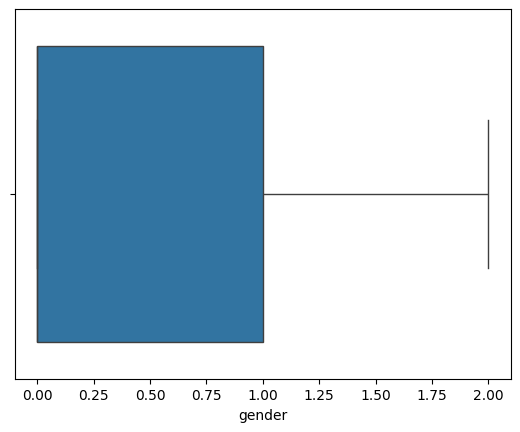

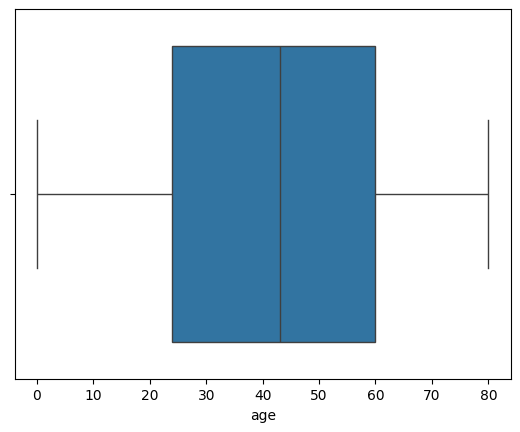

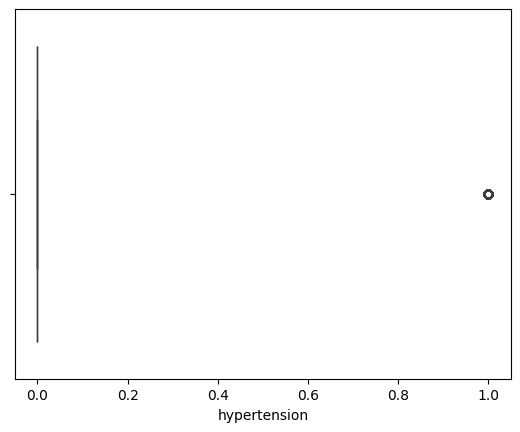

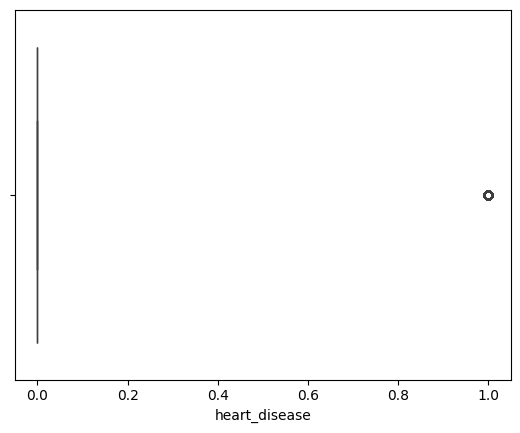

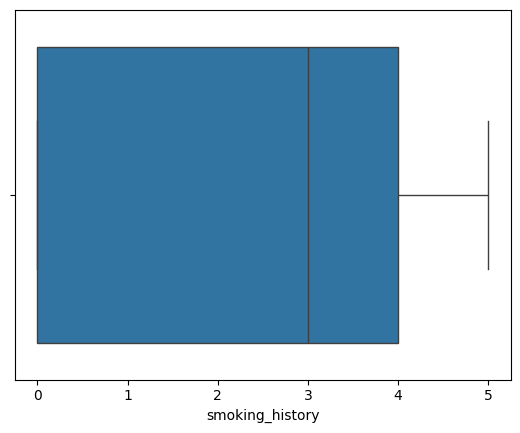

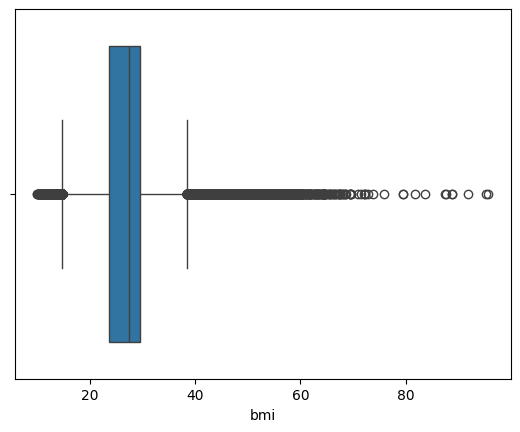

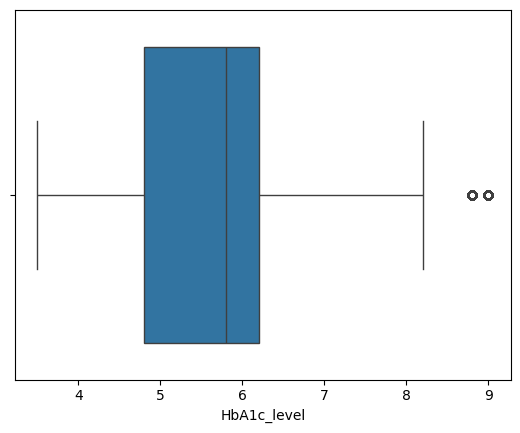

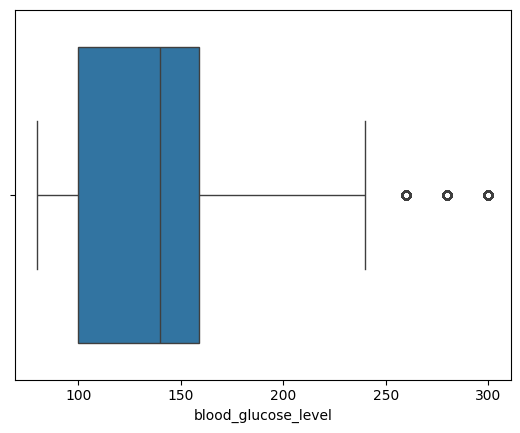

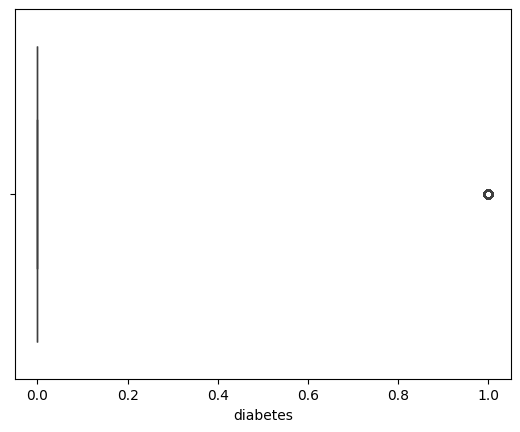

In [33]:
#boxplot for outliers

for i in df.columns:
    sns.boxplot(data=df, x = i)
    plt.show()

In [36]:
df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0.0,80.0,0,1,4.0,25.19,6.6,140,0
1,0.0,54.0,0,0,0.0,27.32,6.6,80,0
2,1.0,28.0,0,0,4.0,27.32,5.7,158,0
3,0.0,36.0,0,0,1.0,23.45,5.0,155,0
4,1.0,76.0,1,1,1.0,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,0.0,80.0,0,0,0.0,27.32,6.2,90,0
99996,0.0,2.0,0,0,0.0,17.37,6.5,100,0
99997,1.0,66.0,0,0,3.0,27.83,5.7,155,0
99998,0.0,24.0,0,0,4.0,35.42,4.0,100,0


In [34]:
#ther is outliers in some columns

def outlier(col):
    q1,q3 =np.percentile(col,[25,75])
    iqr = q3-q1
    l_b = q1 - 1.5*iqr
    u_b = q3 + 1.5*iqr
    return l_b, u_b

#now changing outliers for some of the affected columns and i am not going to remove the column

In [44]:
for i in df.columns:
    data = outlier(df[i])
    print(f"Column: {i}")
    print(data)

Column: gender
(np.float64(-1.5), np.float64(2.5))
Column: age
(np.float64(-30.0), np.float64(114.0))
Column: hypertension
(np.float64(0.0), np.float64(0.0))
Column: heart_disease
(np.float64(0.0), np.float64(0.0))
Column: smoking_history
(np.float64(-6.0), np.float64(10.0))
Column: bmi
(np.float64(14.705), np.float64(38.504999999999995))
Column: HbA1c_level
(np.float64(2.6999999999999993), np.float64(8.3))
Column: blood_glucose_level
(np.float64(11.5), np.float64(247.5))
Column: diabetes
(np.float64(0.0), np.float64(0.0))


SKEWNESS AND KURTOSIS

In [49]:
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt

C:\Users\Jacquline\AppData\Local\Temp\ipykernel_8672\2608756748.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




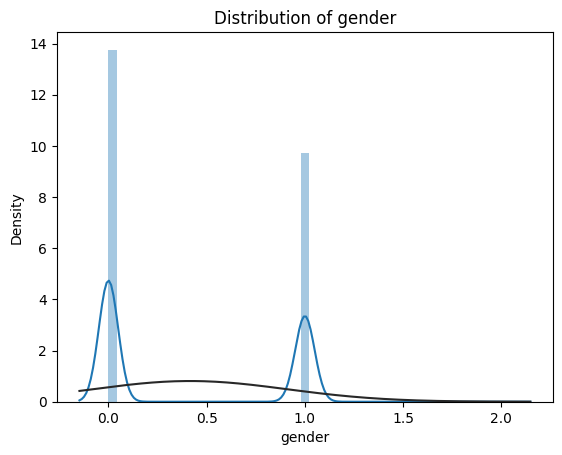

C:\Users\Jacquline\AppData\Local\Temp\ipykernel_8672\2608756748.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




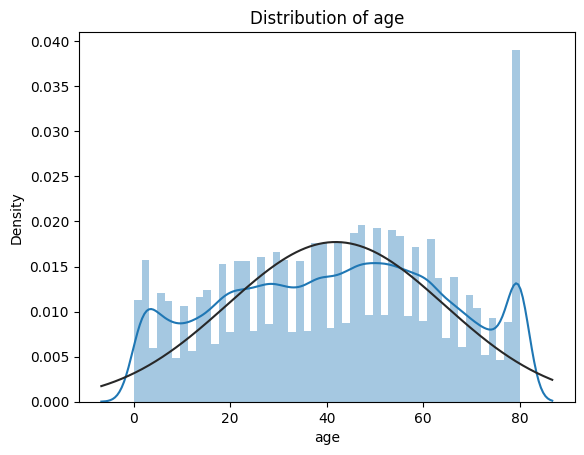

C:\Users\Jacquline\AppData\Local\Temp\ipykernel_8672\2608756748.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




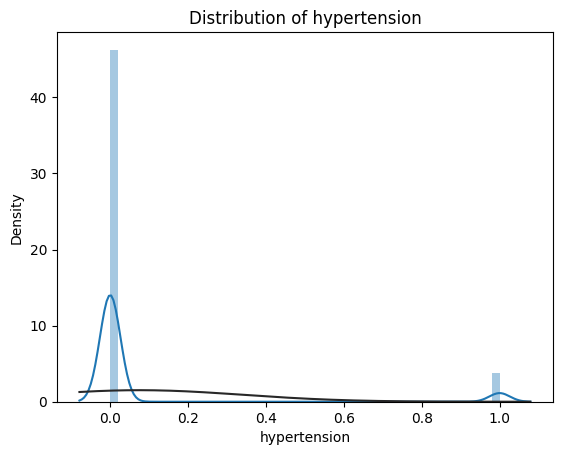

C:\Users\Jacquline\AppData\Local\Temp\ipykernel_8672\2608756748.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




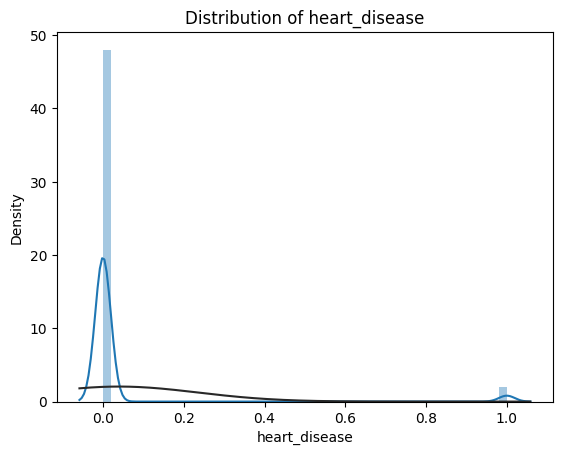

C:\Users\Jacquline\AppData\Local\Temp\ipykernel_8672\2608756748.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




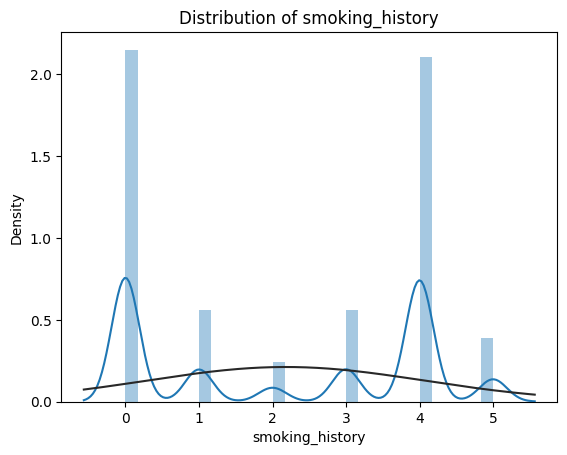

C:\Users\Jacquline\AppData\Local\Temp\ipykernel_8672\2608756748.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




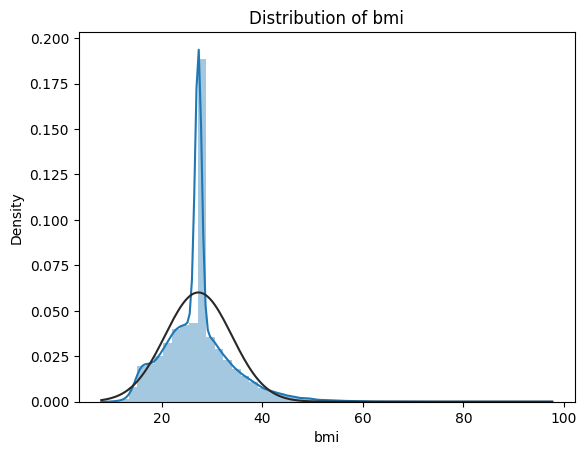

C:\Users\Jacquline\AppData\Local\Temp\ipykernel_8672\2608756748.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




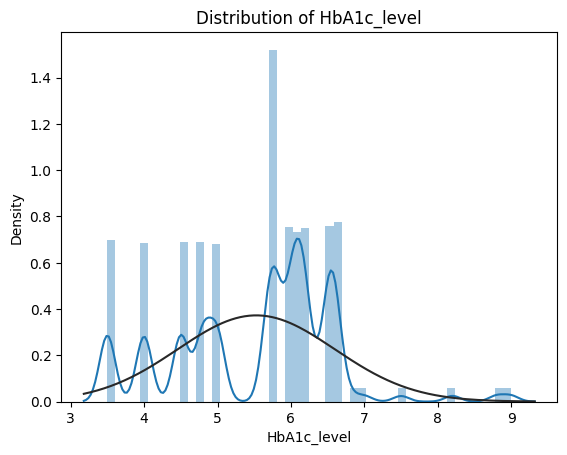

C:\Users\Jacquline\AppData\Local\Temp\ipykernel_8672\2608756748.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




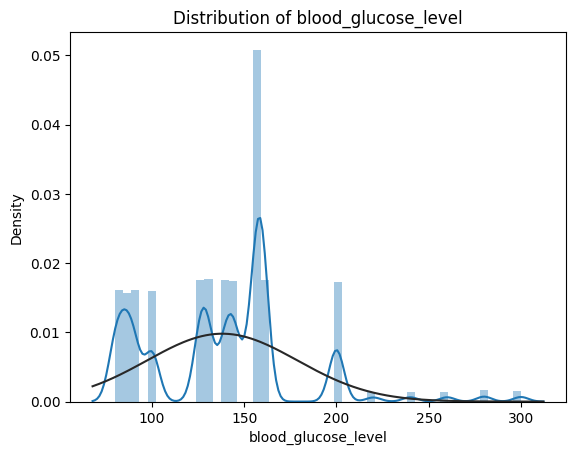

C:\Users\Jacquline\AppData\Local\Temp\ipykernel_8672\2608756748.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




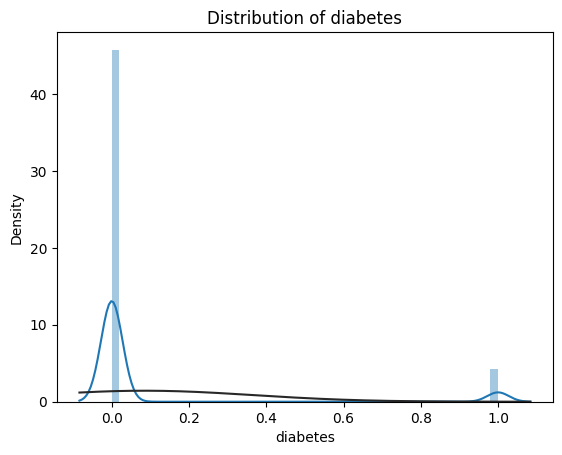

In [51]:
for i in df.columns:
    sns.distplot(df[i], fit=stats.norm)  # Fit a normal distribution
    plt.title(f'Distribution of {i}')
    plt.show()

In [53]:
for i in df.columns:
  print(i, df[i].skew())

gender 0.35095437427050225
age -0.05197899678256747
hypertension 3.2312957890610265
heart_disease 4.733871943500769
smoking_history -0.036546993595164855
bmi 1.0438355183081105
HbA1c_level -0.0668537611478635
blood_glucose_level 0.8216549517517585
diabetes 2.9762170270940076


In [7]:
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt

In [67]:
import plotly.express as px

In [69]:
px.box(df,y = "gender", points="all")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'all',
              'hovertemplate': 'gender=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'box',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([0., 0., 1., ..., 1., 0., 0.]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'gender'}}}
})

In [70]:
px.box(df,y = "age", points="all")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'all',
              'hovertemplate': 'age=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'box',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([80., 54., 28., ..., 66., 24., 57.]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'age'}}}
})

In [71]:
px.box(df,y = "hypertension", points="all")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'all',
              'hovertemplate': 'hypertension=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'box',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([0, 0, 0, ..., 0, 0, 0]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'hypertension'}}}
})

In [72]:
px.box(df,y = "heart_disease", points="all")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'all',
              'hovertemplate': 'heart_disease=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'box',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([1, 0, 0, ..., 0, 0, 0]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'heart_disease'}}}
})

In [73]:
px.box(df,y = "smoking_history", points="all")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'all',
              'hovertemplate': 'smoking_history=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'box',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([4., 0., 4., ..., 3., 4., 1.]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'smoking_history'}}}
})

In [74]:
px.box(df,y = "bmi", points="all")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'all',
              'hovertemplate': 'bmi=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'box',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([25.19, 27.32, 27.32, ..., 27.83, 35.42, 22.43]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'bmi'}}}
})

In [76]:
px.box(df,y = "HbA1c_level", points="all")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'all',
              'hovertemplate': 'HbA1c_level=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'box',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([6.6, 6.6, 5.7, ..., 5.7, 4. , 6.6]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'HbA1c_level'}}}
})

In [77]:
px.box(df,y = "blood_glucose_level", points="all")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'all',
              'hovertemplate': 'blood_glucose_level=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'box',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([140,  80, 158, ..., 155, 100,  90]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'blood_glucose_level'}}}
})

In [78]:
px.box(df,y = "diabetes", points="all")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'all',
              'hovertemplate': 'diabetes=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'box',
              'x0': ' ',
              'xaxis': 'x',
              'y': array([0, 0, 0, ..., 0, 0, 0]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'diabetes'}}}
})

In [3]:
import pandas as pd

df=pd.read_csv("diabetes_prediction_dataset.csv")

In [13]:
df.corr()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
gender,1.000000,-0.030656,0.014203,0.077696,-0.077919,-0.022994,0.019957,0.017199,0.037411
age,-0.030656,1.000000,0.251171,0.233354,0.228608,0.337396,0.101354,0.110672,0.258008
hypertension,0.014203,0.251171,1.000000,0.121262,0.093177,0.147666,0.080939,0.084429,0.197823
heart_disease,0.077696,0.233354,0.121262,1.000000,0.027598,0.061198,0.067589,0.070066,0.171727
smoking_history,-0.077919,0.228608,0.093177,0.027598,1.000000,0.179361,0.037369,0.040219,0.094290
bmi,-0.022994,0.337396,0.147666,0.061198,0.179361,1.000000,0.082997,0.091261,0.214357
HbA1c_level,0.019957,0.101354,0.080939,0.067589,0.037369,0.082997,1.000000,0.166733,0.400660
blood_glucose_level,0.017199,0.110672,0.084429,0.070066,0.040219,0.091261,0.166733,1.000000,0.419558
diabetes,0.037411,0.258008,0.197823,0.171727,0.094290,0.214357,0.400660,0.419558,1.000000


In [9]:
print(df.dtypes)

gender                   int64
age                    float64
hypertension             int64
heart_disease            int64
smoking_history         object
bmi                    float64
HbA1c_level            float64
blood_glucose_level      int64
diabetes                 int64
dtype: object


In [11]:
from sklearn.preprocessing import LabelEncoder
elc1 =LabelEncoder()
df["gender"]=elc1.fit_transform(df["gender"])
df["smoking_history"]=elc1.fit_transform(df["smoking_history"])

In [12]:
df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,4,25.19,6.6,140,0
1,0,54.0,0,0,0,27.32,6.6,80,0
2,1,28.0,0,0,4,27.32,5.7,158,0
3,0,36.0,0,0,1,23.45,5.0,155,0
4,1,76.0,1,1,1,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,0,80.0,0,0,0,27.32,6.2,90,0
99996,0,2.0,0,0,0,17.37,6.5,100,0
99997,1,66.0,0,0,3,27.83,5.7,155,0
99998,0,24.0,0,0,4,35.42,4.0,100,0


In [14]:
cont = []
cat = []
for i in df.columns:
  if df[i].nunique()>12:
    cont.append(i)
  else:
    cat.append(i)

In [15]:
cont

['age', 'bmi', 'HbA1c_level', 'blood_glucose_level']

In [16]:
cat

['gender', 'hypertension', 'heart_disease', 'smoking_history', 'diabetes']

In [17]:
def two_sample(d1,d2):
  m =[0,0]
  for i in range(31):
    sample1 = d1.sample(frac=0.03)
    sample2 = d2.sample(frac=0.04)
    t_test, p_value = stats.ttest_ind(sample1,sample2)
    if p_value < 0.04:
      #print("H0 Reject null hypothesis, Ha accepts alternate hypothesis ,  data is not normally distributed")
      m[1]+=1
    else:
      #print("H0 accept null hypothesis, Ha rejects alternate hypothesis,  data is normally distributed")
      m[0]+=1
    if m[0]>m[1]:
      return True
    elif m[0]<m[1]:
      return False

def chi_square(d1,d2):
  return True if stats.chi2_contingency(pd.crosstab(d1,d2))[1]<0.075 else False

def annova(d1,d2): #assume d1 - continous, d2 - category
  group = df[d2].unique()

  data1 = {}
  for i in group:
    data1[i]=df[d1][df[d2]==i]


  f_value , p_value = stats.f_oneway(*[i for i in data1.values()])
  if p_value<0.075:
    #print("H0 Reject null hypothesis, Ha accepts alternate hypothesis , no connection of the data")
    return False
  else:
    #print("H0 accept null hypothesis, Ha rejects alternate hypothesis, connection present in the data")
    return True



In [18]:
from scipy import stats

In [19]:
final = {}
for i in df.columns:
  final[i] = {}
  for j in df.columns:

    if i in cont and j in cont:
      result = two_sample(df[i],df[j])

    elif i in cat and j in cat:
      result = chi_square(df[i],df[j])

    elif i in cont and j in cat:
      result = annova(i,j)

    elif i in cat and j in cont:
      result = annova(j,i)
    if result :
      final[i][j]=1
    else:
      final[i][j]=0

In [20]:

final_df = pd.DataFrame(final)
final_df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
gender,1,0,1,1,1,0,0,0,1
age,0,1,0,0,0,0,0,0,0
hypertension,1,0,1,1,1,0,0,0,1
heart_disease,1,0,1,1,1,0,0,0,1
smoking_history,1,0,1,1,1,0,0,0,1
bmi,0,0,0,0,0,1,0,0,0
HbA1c_level,0,0,0,0,0,0,1,0,0
blood_glucose_level,0,0,0,0,0,0,0,1,0
diabetes,1,0,1,1,1,0,0,0,1


<Axes: >

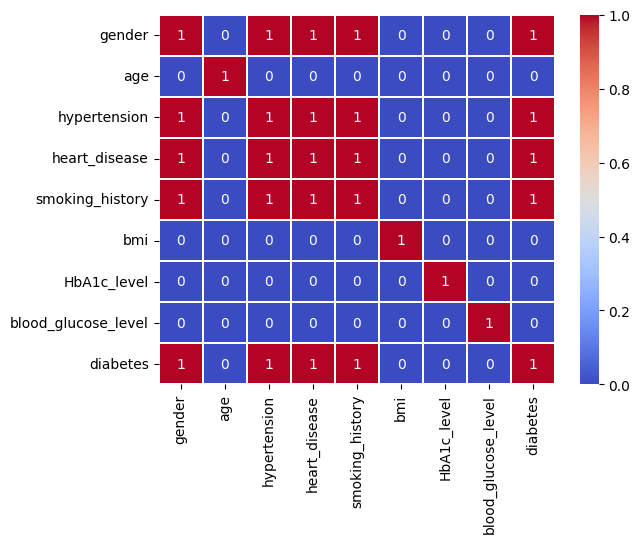

In [21]:
import seaborn as sns
sns.heatmap(final_df,cmap ="coolwarm",linewidths=0.2,annot=True)

In [25]:
from scipy.stats import norm
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

gender 0.35095437427050225


C:\Users\Jacquline\AppData\Local\Temp\ipykernel_12928\1245814640.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i],fit=norm)


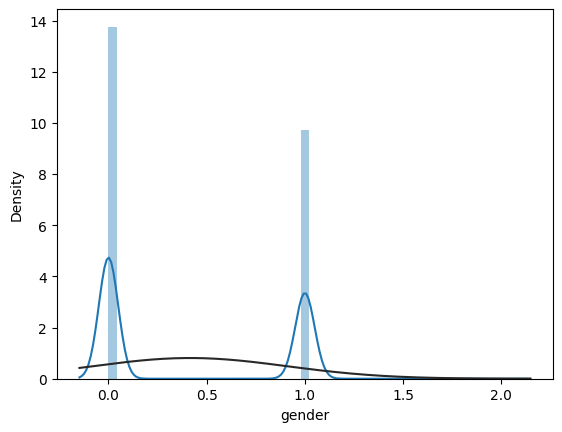

age -0.05197899678256747


C:\Users\Jacquline\AppData\Local\Temp\ipykernel_12928\1245814640.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i],fit=norm)


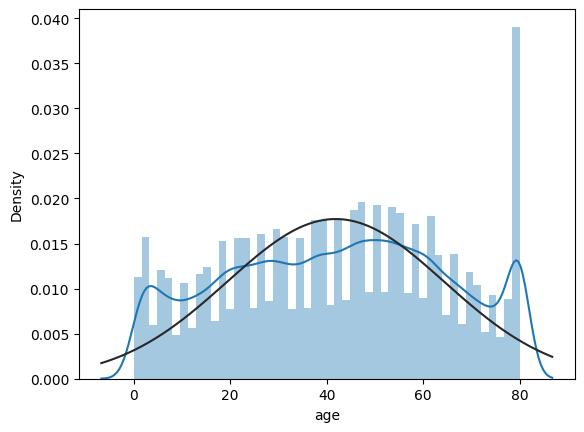

hypertension 3.2312957890610265


C:\Users\Jacquline\AppData\Local\Temp\ipykernel_12928\1245814640.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i],fit=norm)


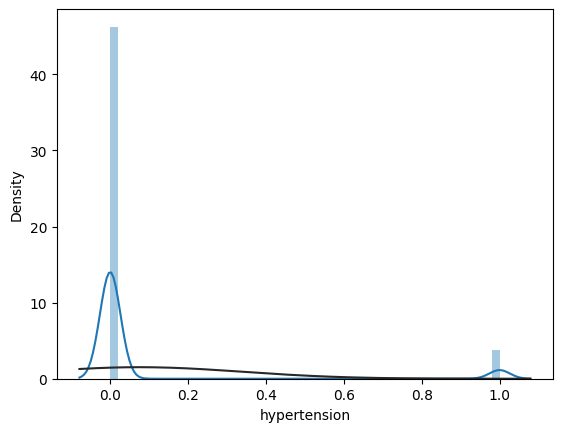

heart_disease 4.733871943500769


C:\Users\Jacquline\AppData\Local\Temp\ipykernel_12928\1245814640.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i],fit=norm)


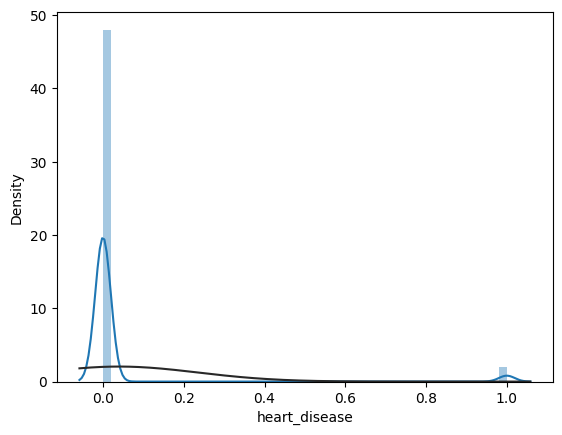

smoking_history -0.036546993595164855


C:\Users\Jacquline\AppData\Local\Temp\ipykernel_12928\1245814640.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i],fit=norm)


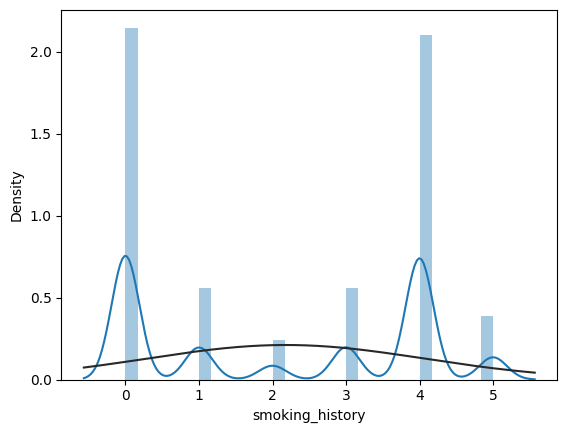

bmi 1.0438355183081105


C:\Users\Jacquline\AppData\Local\Temp\ipykernel_12928\1245814640.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i],fit=norm)


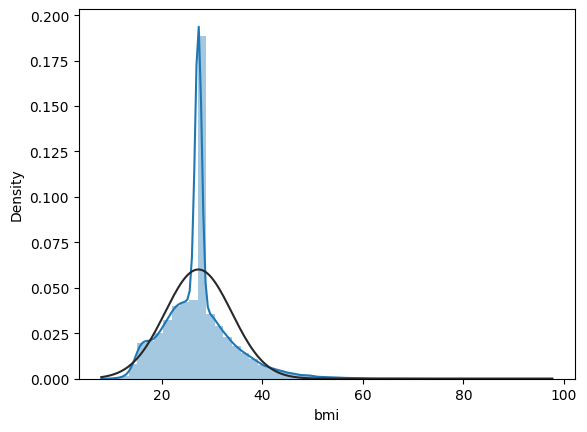

HbA1c_level -0.0668537611478635


C:\Users\Jacquline\AppData\Local\Temp\ipykernel_12928\1245814640.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i],fit=norm)


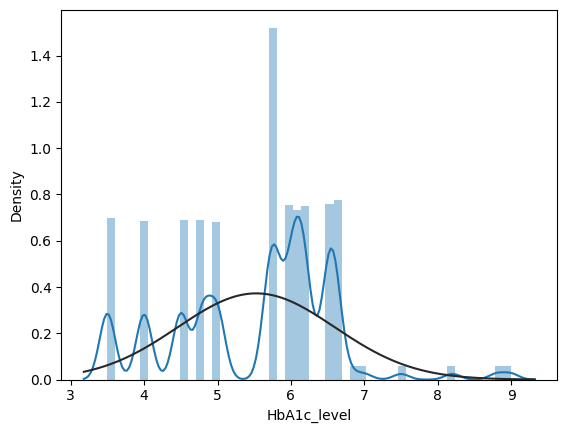

blood_glucose_level 0.8216549517517585


C:\Users\Jacquline\AppData\Local\Temp\ipykernel_12928\1245814640.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i],fit=norm)


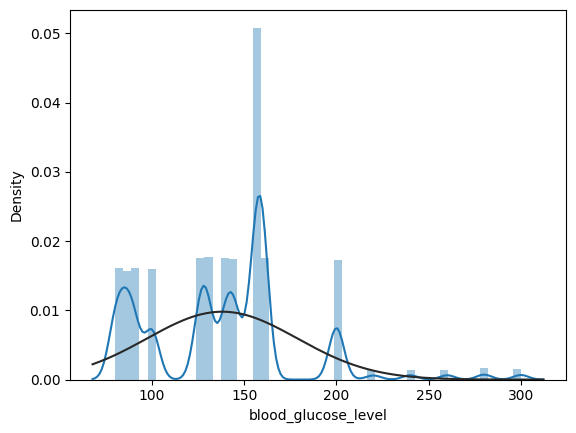

In [26]:
for i in df.columns[:-1]:
  print(i, df[i].skew())
  sns.distplot(df[i],fit=norm)
  plt.show()

In [27]:
from scipy import stats

In [29]:
methods = [0,0.5,-0.5,2,-2,-1]
for j in df.columns:
  print(j)
  for i in methods:
    print(pd.DataFrame(stats.boxcox(df[j],lmbda=i)).skew())

gender
0   NaN
dtype: float64
0    0.347695
dtype: float64
0   NaN
dtype: float64
0    0.407299
dtype: float64
0   NaN
dtype: float64
0   NaN
dtype: float64
age
0   -2.013983
dtype: float64
0   -0.70312
dtype: float64
0   -6.569279
dtype: float64
0    0.697374
dtype: float64


c:\Users\Jacquline\OneDrive\Desktop\DataPrepocessing\.venv\Lib\site-packages\pandas\core\nanops.py:1256: RuntimeWarning: invalid value encountered in subtract
  adjusted = values - mean


0   -44.007557
dtype: float64
0   -20.65242
dtype: float64
hypertension
0   NaN
dtype: float64
0    3.231296
dtype: float64
0   NaN
dtype: float64
0    3.231296
dtype: float64
0   NaN
dtype: float64
0   NaN
dtype: float64
heart_disease
0   NaN
dtype: float64
0    4.733872
dtype: float64
0   NaN
dtype: float64
0    4.733872
dtype: float64
0   NaN
dtype: float64
0   NaN
dtype: float64
smoking_history
0   NaN
dtype: float64
0   -0.320563
dtype: float64
0   NaN
dtype: float64
0    0.36819
dtype: float64
0   NaN
dtype: float64
0   NaN
dtype: float64
bmi
0   -0.139158
dtype: float64
0    0.416082
dtype: float64
0   -0.648391
dtype: float64
0    2.776349
dtype: float64
0   -2.089811
dtype: float64
0   -1.129977
dtype: float64
HbA1c_level
0   -0.591044
dtype: float64
0   -0.348818
dtype: float64
0   -0.80372
dtype: float64
0    0.659313
dtype: float64
0   -1.335902
dtype: float64
0   -0.995097
dtype: float64
blood_glucose_level
0   -0.102166
dtype: float64
0    0.303883
dtype: float64
0   -0.4

In [30]:
from scipy.stats import kurtosis        #using fisher method
for j in df.columns:
  print(j)
  for i in methods:
    print(f" skewness :{pd.DataFrame(stats.boxcox(df[j],lmbda=i)).skew().values}, kurtosis: {kurtosis(df[j])}")

gender
 skewness :[nan], kurtosis: -1.8646740632996803
 skewness :[0.34769534], kurtosis: -1.8646740632996803
 skewness :[nan], kurtosis: -1.8646740632996803
 skewness :[0.40729891], kurtosis: -1.8646740632996803
 skewness :[nan], kurtosis: -1.8646740632996803
 skewness :[nan], kurtosis: -1.8646740632996803
age
 skewness :[-2.01398294], kurtosis: -1.0038448150961254
 skewness :[-0.70311982], kurtosis: -1.0038448150961254
 skewness :[-6.5692795], kurtosis: -1.0038448150961254
 skewness :[0.69737429], kurtosis: -1.0038448150961254
 skewness :[-44.00755746], kurtosis: -1.0038448150961254
 skewness :[-20.65241966], kurtosis: -1.0038448150961254
hypertension
 skewness :[nan], kurtosis: 8.44095923927337
 skewness :[3.23129579], kurtosis: 8.44095923927337
 skewness :[nan], kurtosis: 8.44095923927337
 skewness :[3.23129579], kurtosis: 8.44095923927337
 skewness :[nan], kurtosis: 8.44095923927337
 skewness :[nan], kurtosis: 8.44095923927337
heart_disease
 skewness :[nan], kurtosis: 20.408871293